In [45]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import scipy.stats

from sklearn.model_selection import train_test_split 
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import mean_squared_error

import seaborn as sns
import matplotlib.pyplot as plt

!pip install dtreeviz
from dtreeviz.trees import *

!pip install eli5
import eli5
from eli5.sklearn import PermutationImportance

%matplotlib inline

In [46]:
!pip install lime
import lime 
import lime.lime_tabular

In [47]:
#Para parte 2, feature eng
#from sklearn.preprocessing import LabelEncoder

In [48]:
#treino = ames.query(" YrSold < 2010") #sintaxe para sql query. Parte 2

In [49]:
dt = pd.read_csv('dataset_airbnb.csv', sep=';') 

In [50]:
dt.head()

,room_id,room_type,city,borough,neighborhood,reviews,overall_satisfaction,accommodates,bedrooms,price,property_type
0,3732200,Shared room,Sao Paulo,SAO PAULO,Mooca,0,0.0,5,1.0,47.0,House
1,2247926,Shared room,Sao Paulo,SAO PAULO,Pinheiros,0,0.0,16,1.0,21.0,Bed & Breakfast
2,2674673,Shared room,Sao Paulo,SAO PAULO,Itaquera,0,0.0,8,1.0,311.0,House
3,2996011,Shared room,Sao Paulo,SAO PAULO,Penha,0,0.0,5,1.0,389.0,Apartment
4,2939182,Shared room,Sao Paulo,SAO PAULO,Iguatemi,0,0.0,4,1.0,311.0,House


#Heatmap 

Mapa de calor de correlações entre as variáveis.
Unicas variáveis que poderia se considerar com uma correlação significativa seriam "accommodates" e "bedrooms". 
No entanto serão ambas mantidas nesse primeiro momento.

In [51]:
corr_var = dt.corr().round(2)

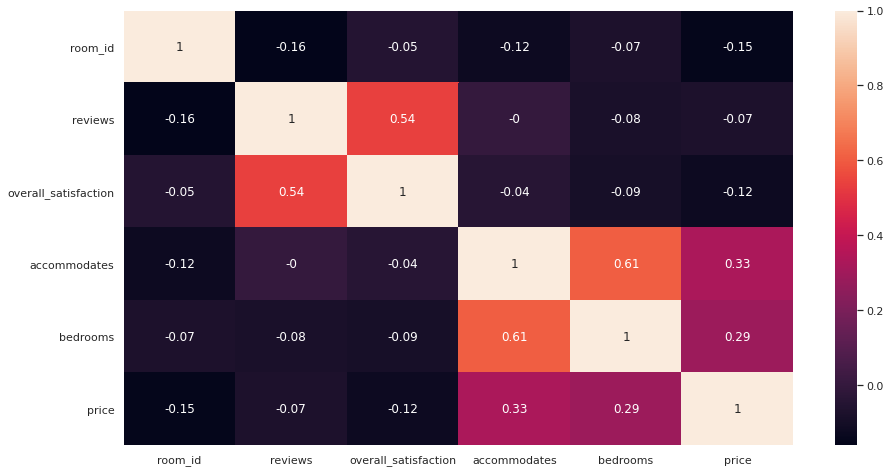

In [52]:
sns.set(rc={'figure.figsize':(15,8)})
sns.heatmap(data=corr_var, annot=True) 

#Análise preliminar do dataset

In [53]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11118 entries, 0 to 11117
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   room_id               11118 non-null  int64  
 1   room_type             11118 non-null  object 
 2   city                  11118 non-null  object 
 3   borough               11118 non-null  object 
 4   neighborhood          11118 non-null  object 
 5   reviews               11118 non-null  int64  
 6   overall_satisfaction  11118 non-null  float64
 7   accommodates          11118 non-null  int64  
 8   bedrooms              11118 non-null  float64
 9   price                 11118 non-null  float64
 10  property_type         11118 non-null  object 
dtypes: float64(3), int64(3), object(5)
memory usage: 955.6+ KB


In [54]:
dt.nunique()

room_id                 11118
room_type                   3
city                        1
borough                    31
neighborhood              138
reviews                   128
overall_satisfaction        7
accommodates               16
bedrooms                   11
price                     330
property_type              29
dtype: int64

In [55]:
dt.duplicated().sum() # Sem Linhas duplicadas

0

In [56]:
dt['room_type'].unique() #Quarto compartilhado, privado...

array(['Shared room', 'Entire home/apt', 'Private room'], dtype=object)

In [57]:
dt['borough'].unique() 

array(['SAO PAULO', 'SANTO ANDRE', 'CARAPICUIBA', 'GUARULHOS',
       'SAO BERNARDO DO CAMPO', 'BARUERI', 'OSASCO', 'TABOAO DA SERRA',
       'CAIEIRAS', 'COTIA', 'MAIRIPORA', 'SAO CAETANO DO SUL', 'DIADEMA',
       'RIBEIRAO PIRES', 'SANTANA DE PARNAIBA', 'ARUJA',
       'ITAPECERICA DA SERRA', 'JANDIRA', 'EMBU', 'EMBU GUACU', 'MAUA',
       'FERRAZ DE VASCONCELOS', 'RIO GRANDE DA SERRA', 'ITAPEVI',
       'CAJAMAR', 'SAO LOURENCO DA SERRA', 'SUZANO', 'POA',
       'FRANCISCO MORATO', 'FRANCO DA ROCHA', 'ITAQUAQUECETUBA'],
      dtype=object)

In [58]:
dt['neighborhood'].unique()

array(['Mooca', 'Pinheiros', 'Itaquera', 'Penha', 'Iguatemi',
       'Santa Cecília', 'Bela Vista', 'Sacomã', 'Bom Retiro', 'República',
       'Cambuci', 'Santo André', 'Vila Mariana', 'Barra Funda', 'Cursino',
       'Jardim Paulista', 'Moema', 'Consolação', 'Carapicuíba',
       'Ipiranga', 'José Bonifácio', 'Cidade Líder', 'Saúde', 'Jaraguá',
       'Anhangüera', 'Vila Matilde', 'Liberdade', 'Itaim Bibi',
       'Jardim São Luís', 'Sé', 'Lapa', 'Cidade Tiradentes', 'Guarulhos',
       'Capão Redondo', 'Cidade Dutra', 'Campo Belo',
       'São Bernardo do Campo', 'São Lucas', 'Vila Sônia', 'Barueri',
       'Osasco', 'Perdizes', 'Butantã', 'Taboão da Serra', 'Vila Andrade',
       'Freguesia do Ó', 'Pirituba', 'Caieiras', 'Cotia', 'Santo Amaro',
       'Jabaquara', 'Alto de Pinheiros', 'Tatuapé', 'Mairiporã',
       'Santana', 'Rio Pequeno', 'São Domingos', 'Aricanduva',
       'Jardim Presidente Dutra', 'Vila Formosa', 'Vila Guilherme',
       'Água Rasa', 'Jaçanã', 'Tucuruvi', 'Sã

In [59]:
#SPBairro = dt['borough'].query("== SAO PAULO")

In [60]:
dt['price'].describe()

count    11118.000000
mean        84.027613
std        223.382397
min          3.000000
25%         25.000000
50%         43.000000
75%         72.000000
max      10905.000000
Name: price, dtype: float64

#Dados gerais do dataset

11118 amostras, 0 linhas duplicadas, Grande São Paulo, 31 municípios, 138 bairros, Notas de 0 a 5.

Informações sobre tipo de imóvel e tipo de aluguel (Casa/Ap inteiro, quarto dividido...) 

Preços variando entre 3 e 10905 reais. 

Média de 84 reais. Percentil de 50% em 43 reais. Desvio padrão de 223

Valores bem dispersos em especial o valor máximo (10905) sendo que o percentil de 75% é de 72 reais.

#Feature Engeneering

**Deletando Features desnecessárias**

dt['room_id'] => ID do imóvel na base

dt['city'] => São todos da grande São Paulo (um único valor) 

dt['borough'] => Municípios e bairros foram agregados em uma única coluna

**Winsorização** 

A variável preço apresenta outliers muito relevantes, com o menor valor de 3 ( aproximadamente 12% do primeiro quartil) e maior de 10905 (aproximadamente 151x o ultimo quartil)

**Categorização de bairros**

Devido ao número elevado de bairros em comparação os bairros foram agrupados todos nos seus respectivos municípios. No caso de São Paulo os municípios foram agrupados por região (norte, sul, leste, oeste e centro)

In [61]:
del dt['room_id']
del dt['city']
del dt['borough']

In [62]:
dt['bedrooms'] = dt['bedrooms'].astype(int) #Transformando numero de quartos em int

In [63]:
dt['price'] = scipy.stats.mstats.winsorize(dt['price'], limits=0.05)

In [64]:
dt['price'].describe()

count    11118.000000
mean        65.503418
std         65.724881
min         14.000000
25%         25.000000
50%         43.000000
75%         72.000000
max        280.000000
Name: price, dtype: float64

In [65]:
def cidades(cidade):
    if cidade == 'Santo André': 
        return 'Santo Andre'
    elif cidade == 'Paranapiacaba': 
        return 'Santo Andre'        
    elif cidade == 'Carapicuíba': 
        return 'Carapicuiba'
    elif cidade == 'Aldeia de Carapicuíba': 
        return 'Carapicuiba'
    elif cidade == 'Vila Dirce': 
        return 'Carapicuiba'                
    elif cidade == 'Guarulhos': 
        return 'Guarulhos'
    elif cidade == 'Jardim Presidente Dutra': 
        return 'Guarulhos'        
    elif cidade == 'São Bernardo do Campo': 
        return "Sao Bernado"
    elif cidade == 'Riacho Grande': 
        return "Sao Bernado"        
    elif cidade == 'Barueri': 
        return 'Barueri'
    elif cidade == 'Aldeia': 
        return 'Barueri'  
    elif cidade == 'Jardim Belval': 
        return 'Barueri' 
    elif cidade == 'Jardim Silveira': 
        return 'Barueri'
    elif cidade == 'Osasco': 
        return 'Osasco'
    elif cidade == 'Taboão da Serra': 
        return 'Taboao da Serra'
    elif cidade == 'Caieiras': 
        return 'Caieiras'
    elif cidade == 'Cotia': 
        return 'Cotia'
    elif cidade == 'Mairiporã': 
        return 'Mairipora'
    elif cidade == 'São Caetano do Sul': 
        return 'São Caetano do Sul'
    elif cidade == 'Diadema': 
        return 'Diadema'
    elif cidade == 'Ribeirão Pires': 
        return 'Ribeirao Pires'
    elif cidade == 'Santana de Parnaíba': 
        return 'Santana de Parnaiba'
    elif cidade == 'Arujá': 
        return 'Aruja'
    elif cidade == 'Itapecerica da Serra': 
        return 'Itapecerica da Serra'
    elif cidade == 'Jandira': 
        return 'Jandira'
    elif cidade == 'Embu': 
        return 'Embu'
    elif cidade == 'Embu-Guaçu': 
        return 'Embu-Guacu'
    elif cidade == 'Mauá': 
        return 'Maua'
    elif cidade == 'Capuava': 
        return 'Maua'      
    elif cidade == 'Ferraz de Vasconcelos': 
        return 'Ferraz de Vasconcelos'
    elif cidade == 'Rio Grande da Serra': 
        return 'Rio Grande da Serra'
    elif cidade == 'Itapevi': 
        return 'Itapevi'
    elif cidade == 'Cajamar': 
        return 'Cajamar'
    elif cidade == 'Polvilho': 
        return 'Cajamar'        
    elif cidade == 'Jordanésia': 
        return 'Cajamar'        
    elif cidade == 'São Lourenço da Serra': 
        return 'Sao Lourenço da Serra'
    elif cidade == 'Suzano': 
        return 'Suzano'
    elif cidade == 'Ouro Fino Paulista': 
        return 'Suzano'        
    elif cidade == 'Poá': 
        return 'Poa'
    elif cidade == 'Francisco Morato': 
        return 'Francisco Morato'
    elif cidade == 'Franco da Rocha': 
        return 'Franco da Rocha'
    elif cidade == 'Itaquaquecetuba': 
        return 'Itaquaquecetuba'

    elif cidade == 'Anhangüera': 
        return 'Zona Norte'
    elif cidade == 'Brasilândia': 
        return 'Zona Norte'
    elif cidade == 'Cachoeirinha': 
        return 'Zona Norte'       
    elif cidade == 'Casa Verde': 
        return 'Zona Norte'
    elif cidade == 'Freguesia do Ó': 
        return 'Zona Norte'
    elif cidade == 'Jaraguá': 
        return 'Zona Norte'
    elif cidade == 'Jaçanã': 
        return 'Zona Norte'       
    elif cidade == 'Limão': 
        return 'Zona Norte'
    elif cidade == 'Mandaqui': 
        return 'Zona Norte'
    elif cidade == 'Perus': 
        return 'Zona Norte'
    elif cidade == 'Pirituba': 
        return 'Zona Norte' 
    elif cidade == 'Santana': 
        return 'Zona Norte' 
    elif cidade == 'São Domingos': 
        return 'Zona Norte' 
    elif cidade == 'São Miguel': 
        return 'Zona Norte' 
    elif cidade == 'Tremembé': 
        return 'Zona Norte' 
    elif cidade == 'Tucuruvi': 
        return 'Zona Norte'                 
    elif cidade == 'Vila Guilherme': 
        return 'Zona Norte'  
    elif cidade == 'Vila Maria': 
        return 'Zona Norte'  
    elif cidade == 'Vila Medeiros': 
        return 'Zona Norte'  

    elif cidade == 'Aricanduva': 
        return 'Zona Leste'
    elif cidade == 'Artur Alvim': 
        return 'Zona Leste'
    elif cidade == 'Belém': 
        return 'Zona Leste'        
    elif cidade == 'Cangaíba': 
        return 'Zona Leste'
    elif cidade == 'Carrão': 
        return 'Zona Leste'  
    elif cidade == 'Cidade Líder': 
        return 'Zona Leste'
    elif cidade == 'Cidade Tiradentes': 
        return 'Zona Leste' 
    elif cidade == 'Ermelino Matarazzo': 
        return 'Zona Leste'
    elif cidade == 'Guaianases': 
        return 'Zona Leste'  
    elif cidade == 'Iguatemi': 
        return 'Zona Leste'
    elif cidade == 'Itaim Paulista': 
        return 'Zona Leste'                    
    elif cidade == 'Itaquera': 
        return 'Zona Leste'   
    elif cidade == 'Jardim Helena': 
        return 'Zona Leste'  
    elif cidade == 'José Bonifácio': 
        return 'Zona Leste'  
    elif cidade == 'Lajeado': 
        return 'Zona Leste'  
    elif cidade == 'Mooca': 
        return 'Zona Leste'  
    elif cidade == 'Pari': 
        return 'Zona Leste'
    elif cidade == 'Parque do Carmo':
        return 'Zona Leste'  
    elif cidade == 'Penha': 
        return 'Zona Leste'    
    elif cidade == 'Ponte Rasa': 
        return 'Zona Leste'
    elif cidade == 'Sapopemba': 
        return 'Zona Leste'  
    elif cidade == 'São Lucas': 
        return 'Zona Leste'   
    elif cidade == 'São Rafael': 
        return 'Zona Leste'
    elif cidade == 'Tatuapé': 
        return 'Zona Leste'  
    elif cidade == 'Vila Curuçá': 
        return 'Zona Leste'  
    elif cidade == 'Vila Formosa': 
        return 'Zona Leste'
    elif cidade == 'Vila Jacuí': 
        return 'Zona Leste'        
    elif cidade == 'Vila Matilde': 
        return 'Zona Leste'     
    elif cidade == 'Vila Prudente': 
        return 'Zona Leste'     
    elif cidade == 'Água Rasa': 
        return 'Zona Leste'  

    elif cidade == 'Campo Belo': 
        return 'Zona Sul'
    elif cidade == 'Campo Grande': 
        return 'Zona Sul'
    elif cidade == 'Campo Limpo': 
        return 'Zona Sul'
    elif cidade == 'Capão Redondo': 
        return 'Zona Sul'
    elif cidade == 'Cidade Ademar': 
        return 'Zona Sul'
    elif cidade == 'Cidade Dutra': 
        return 'Zona Sul'
    elif cidade == 'Cursino': 
        return 'Zona Sul'
    elif cidade == 'Grajaú': 
        return 'Zona Sul'
    elif cidade == 'Ipiranga': 
        return 'Zona Sul'
    elif cidade == 'Jabaquara': 
        return 'Zona Sul'
    elif cidade == 'Jardim São Luís': 
        return 'Zona Sul'
    elif cidade == 'Jardim Ângela': 
        return 'Zona Sul'        
    elif cidade == 'Marsilac': 
        return 'Zona Sul'
    elif cidade == 'Moema': 
        return 'Zona Sul'
    elif cidade == 'Morumbi': 
        return 'Zona Sul'
    elif cidade == 'Parelheiro': 
        return 'Zona Sul'
    elif cidade == 'Pedreira': 
        return 'Zona Sul'
    elif cidade == 'Sacomã': 
        return 'Zona Sul'
    elif cidade == 'Santo Amaro': 
        return 'Zona Sul'
    elif cidade == 'Saúde': 
        return 'Zona Sul'
    elif cidade == 'Socorro': 
        return 'Zona Sul'
    elif cidade == 'São Mateus': 
        return 'Zona Sul'
    elif cidade == 'Vila Mariana': 
        return 'Zona Sul'        
    elif cidade == 'Vila Sônia': 
        return 'Zona Sul' 

    elif cidade == 'Anhangüera': 
        return 'Centro'
    elif cidade == 'Bela Vista': 
        return 'Centro'
    elif cidade == 'Bom Retiro': 
        return 'Centro'       
    elif cidade == 'Brás': 
        return 'Centro'
    elif cidade == 'Cambuci': 
        return 'Centro'
    elif cidade == 'Consolação': 
        return 'Centro' 
    elif cidade == 'Liberdade': 
        return 'Centro'
    elif cidade == 'República': 
        return 'Centro'
    elif cidade == 'Santa Cecília': 
        return 'Centro' 
    elif cidade == 'Sé': 
        return 'Centro'
 
    elif cidade == 'Alto de Pinheiros': 
        return 'Zona Oeste'
    elif cidade == 'Barra Funda' : 
        return 'Zona Oeste'
    elif cidade == 'Butantã': 
        return 'Zona Oeste'
    elif cidade == 'Itaim Bibi': 
        return 'Zona Oeste'   
    elif cidade == 'Jaguara': 
        return 'Zona Oeste'
    elif cidade == 'Jaguaré': 
        return 'Zona Oeste'
    elif cidade == 'Jardim Paulista': 
        return 'Zona Oeste'   
    elif cidade == 'Lapa': 
        return 'Zona Oeste'   
    elif cidade == 'Perdizes': 
        return 'Zona Oeste'
    elif cidade == 'Pinheiros': 
        return 'Zona Oeste'   
    elif cidade == 'Raposo Tavares': 
        return 'Zona Oeste' 
    elif cidade == 'Rio Pequeno': 
        return 'Zona Oeste'
    elif cidade == 'Vila Leopoldina': 
        return 'Zona Oeste'                          

In [66]:
dt['neighborhood'] = dt['neighborhood'].apply(cidades)

In [67]:
dt['neighborhood'].unique()

array(['Zona Leste', 'Zona Oeste', 'Centro', 'Zona Sul', 'Santo Andre',
       'Carapicuiba', 'Zona Norte', 'Guarulhos', 'Sao Bernado', 'Barueri',
       'Osasco', 'Taboao da Serra', None, 'Caieiras', 'Cotia',
       'Mairipora', 'São Caetano do Sul', 'Diadema', 'Ribeirao Pires',
       'Santana de Parnaiba', 'Aruja', 'Itapecerica da Serra', 'Jandira',
       'Embu', 'Maua', 'Embu-Guacu', 'Ferraz de Vasconcelos',
       'Rio Grande da Serra', 'Itapevi', 'Cajamar', 'Suzano',
       'Sao Lourenço da Serra', 'Poa', 'Francisco Morato',
       'Franco da Rocha', 'Itaquaquecetuba'], dtype=object)

#Aplicando One Hot Enconding

Aplicando One Hot Enconding para as variáveis categóricas (DropFirst False), pois elas não apresentam claro ordenamento entre elas 

In [68]:
dt = pd.get_dummies(dt)

# Train/Test split e Padronização

In [69]:
y = dt['price']
del dt['price']
x = dt

In [70]:
#70/30 teste treino
x_train, x_test, y_train, y_test = train_test_split(x, y, 
                                                    test_size=0.3, 
                                                    random_state=42)

In [71]:
sc = StandardScaler()
x_train_scaled = sc.fit_transform(x_train)
x_test_scaled  = sc.transform(x_test)

#Regressão Linear

In [72]:
lr= LinearRegression()

In [73]:
lr.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [74]:
y_pred= lr.predict(x_test)

In [75]:
print('MSE (Treino)', mean_squared_error(y_train, lr.predict(x_train)))
print('RMSE (Treino)', np.sqrt(mean_squared_error(y_train, lr.predict(x_train))))

MSE (Treino) 2501.8771421053916
RMSE (Treino) 50.0187678987137


In [76]:
lr.score(x_train, y_train) # Score baixo.

0.4229822201159751

In [77]:
print('MSE (Teste)', mean_squared_error(y_test, y_pred))
print('RMSE (Teste)', np.sqrt(mean_squared_error(y_test, y_pred)))

MSE (Teste) 2445.0518225667656
RMSE (Teste) 49.44746527949401


In [78]:
lr.score(x_test, y_test) # Score baixo.

0.4288134536968131

In [79]:
y_hat = lr.predict(x)

In [80]:
residuos = y - y_hat

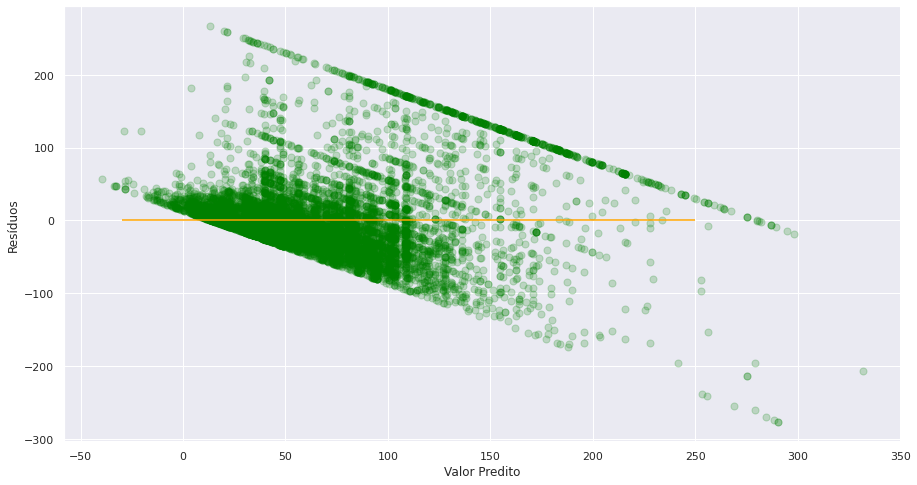

In [81]:
plt.scatter(y=residuos, x=y_hat, color='green', s=50, alpha=.2)
plt.hlines(y=0, xmin=-30, xmax=250, color='orange')
plt.ylabel('Resíduos')
plt.xlabel('Valor Predito')
plt.show()

A Regressão Linear não se apresentou como um bom modelo. 
Não existe linearidade na predição da variável preço, a julgar pelo score baixo.

Considerando que a média de preços é de 65 reais, um modelo que apresenta um erro médio de 49 reais (75% da média) provavelmente não será de muita utilidade.   

Gráfico demostra que os resíduos se concentraram muito na região de 10 e -80 o que significa que no geral grande parte dos valores reais são menores do que os previstos pelo modelo.

#Árvore de Decisão

Descobrindo melhor profundidade utilizado validação cruzada

In [82]:
max_depth = (3, 6, 9, 12, 15)

In [83]:
rmse = []
menor = 100
best_max_depth = 0
best_i = 0

for i, md in enumerate(max_depth):
  dtr = DecisionTreeRegressor(random_state=42, max_depth=md)
  score = cross_val_score(dtr, x_train, y_train, cv=5, scoring='neg_mean_squared_error').mean()
  print("i = ", i, " md = ", md ,  " score = ", np.sqrt(-score))
  rmse.append(np.sqrt(-score))
  if np.sqrt(-score) < menor:
    menor = np.sqrt(-score)
    best_max_depth = md
    best_i = i

print('\n *** O melhor desempenho foi com max_depth = ', best_max_depth,  " RMSE = ", menor)

i =  0  md =  3  score =  50.28199999166833
i =  1  md =  6  score =  47.201041006547854
i =  2  md =  9  score =  48.859052790761936
i =  3  md =  12  score =  51.10655362306215
i =  4  md =  15  score =  52.450939346356684

 *** O melhor desempenho foi com max_depth =  6  RMSE =  47.201041006547854


In [84]:
rt = DecisionTreeRegressor(random_state=42, max_depth=6)

In [85]:
rt.fit(x_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=6,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=42, splitter='best')

In [86]:
print('MSE (treino)', mean_squared_error(y_train, rt.predict(x_train)))
print('RMSE (treino)', np.sqrt(mean_squared_error(y_train, rt.predict(x_train))))

MSE (treino) 2061.645194381802
RMSE (treino) 45.40534323603117


In [87]:
print('MSE (teste)', mean_squared_error(y_test, rt.predict(x_test)))
print('RMSE (teste)', np.sqrt(mean_squared_error(y_test, rt.predict(x_test))))

MSE (teste) 2145.2082948876036
RMSE (teste) 46.316393370896265


In [88]:
viz = dtreeviz(rt, 
               x_train,
               y_train,
               target_name='price',
               feature_names = dt.columns)

In [89]:
viz

A árvore de decisão se mostrou um modelo um pouco superior a regressão linear.

Após testes utilizando a validação curzada para descobrir qual seria a profundidade máxima ideal, percebemos que os valores de treino e teste são bem similares. Isso sugere que conseguimos evitar um overfitting do modelo.

Conseguimos um valor da raiz do erro médio ao quadrado (RMSE) de ~46 reais e um erro médio de ~45 reais em treino.

Considerando que a média é de 65 reais e percentil de 50% em 43 reais, ainda é um erro médio considerável (69% da média)

Na arvore(acima exposta) temos que o número de quartos é a variável de maior relevância e depois segmentados se são alugueis de imóveis de inteiros OU se são localizados nos bairros da zona leste de São Paulo.

Isso demosntra que localização (bairro) pode ser muita relevância no preço, dependendo do bairro.

#Random Forest

In [90]:
rf = RandomForestRegressor(random_state=42)

In [91]:
n_estimators = [int(x) for x in np.linspace(1000, 1400, num=5)] # Número de arvores 
max_features = ['auto', 'sqrt']                                # Número maximo de colunas (features) a serem utilizados
max_depth = [int(x) for x in np.linspace(5, 30, num=5)]        # Profundidade maxima da arvore
min_samples_split = [5,10,20]                                   # Minimo de amostras para abrir(split) em novos grupos
min_samples_leaf = [1,2,5,10]                                   # Minimo de amostras em cada folha

In [92]:
params = { 'n_estimators' : n_estimators,
          'max_features' : max_features,
           'max_depth' : max_depth,
           'min_samples_split' : min_samples_split,
          'min_samples_leaf' : min_samples_leaf
}

In [93]:
random_rf = RandomizedSearchCV(estimator = rf,
                       param_distributions = params,
                       n_iter = 100,
                       cv = 3,
                       verbose = 2,
                       n_jobs = -1, 
                       random_state=42)

In [94]:
random_rf.fit(x_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 14.7min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 27.1min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [95]:
random_rf.best_estimator_

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=17, max_features='sqrt', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=20, min_weight_fraction_leaf=0.0,
                      n_estimators=1200, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

In [96]:
random_rf.best_score_

0.5069037706052534

In [97]:
rf_best_est = random_rf.best_estimator_

In [98]:
rf_best_est.fit(x_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=17, max_features='sqrt', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=20, min_weight_fraction_leaf=0.0,
                      n_estimators=1200, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

In [99]:
print('MSE (treino)', mean_squared_error(y_train, rf_best_est.predict(x_train)))
print('RMSE (treino)', np.sqrt(mean_squared_error(y_train, rf_best_est.predict(x_train))))

MSE (treino) 1804.3604483045726
RMSE (treino) 42.477764163201584


In [100]:
print('MSE (teste)', mean_squared_error(y_test, rf_best_est.predict(x_test)))
print('RMSE (teste)', np.sqrt(mean_squared_error(y_test, rf_best_est.predict(x_test))))

MSE (teste) 2030.2792026834763
RMSE (teste) 45.058619626920176


O modelo Random Forest mostrou muito resultado muito similar da árvore de decisão

Apresentou tambem um valor da raiz do erro médio ao quadrado (RMSE) de ~45 reais e um erro médio de ~42 reais em treino.

O erro médio em treino foi perceptivelmente melhor no modelo Random Forest, ainda que o resultado em teste

Entretanto, devido ao fato do modelo Random Forest abrigar diversas árvores, ele apresentou um resultado **em teste**  melhor.

Ainda sim um RMSE de ~45 em teste é um valor alto, considerando a média (65) e o desvio padrão (65).

Isso é refletido no baixo score obtido pelo modelo (0.50)

#ELI5


Análise das principais variáveis de interesse do modelo Random Forest

In [101]:
perm  = PermutationImportance(rf_best_est).fit(x_train, y_train)

In [102]:
eli5.show_weights(perm, feature_names = list(dt.columns))

Weight,Feature
0.1990 ± 0.0184,accommodates
0.1498 ± 0.0120,reviews
0.1094 ± 0.0067,room_type_Entire home/apt
0.0976 ± 0.0067,bedrooms
0.0649 ± 0.0035,neighborhood_Zona Leste
0.0600 ± 0.0062,room_type_Private room
0.0395 ± 0.0044,overall_satisfaction
0.0210 ± 0.0010,neighborhood_Zona Oeste
0.0199 ± 0.0014,property_type_House
0.0164 ± 0.0024,property_type_Apartment


A variável de principal peso é o número de pessoas que podem se hospedar no imóvel. (aproximadamente 20% do peso do aluguel)

A segunda variável de maior interesse é o número de resenhas. Quanto maior o número de avaliações, o preço a tende a ser mais alto, provavelmente por gerar um nível maior de confiança.

Seguido pela lista, se imóvel é uma casa/apartamento inteiro. É provavel que este seja considerado um fator relevante pelo conforto e segurança que gera ao não precisar dividir o imóvel com desconhecidos.

Temos depois o número de quartos como impacto de preços. Imóveis maiores naturalmente tem um valor mais elevador. 

Esta variável tem uma correlação razoável (0.61) com a quantidade de pessoas que ela comporta porém, não totalmente (quartos podem cabem mais de 1 pessoa).  

#LIME

In [103]:
treino = x_train.values

In [104]:
explainer = lime.lime_tabular.LimeTabularExplainer(treino,
                                                  feature_names = dt.columns, 
                                                   categorical_features = [],
                                                   verbose = True,
                                                   mode = 'regression')

In [105]:
teste = x_test.values

In [108]:
exp = explainer.explain_instance(teste[420], rf_best_est.predict)

Intercept 192.49498790643162
Prediction_local [37.97035552]
Right: 31.531078736502913


In [109]:
exp.show_in_notebook(show_table=True)

Valores da arvore número 420 do modelo Random Forest.

Partindo do preço de 192 reais temos fatores influenciando influenciando negativamente (tipo de propriedade) e positivamente (bairro)